In [3]:
import AutoPhenom as ap
import PyPhenom as ppi
import license

from pathlib import Path
import numpy as np
import cv2
import json
from IPython.display import display
from PIL import Image
import time
import csv
import math
import hyperspy.api as hs
from datetime import datetime
import matplotlib.pyplot as plt
from segment_circles import segment_circles


In [4]:
## Prepare the Phenom SEM ##
address = ppi.FindPhenom(1).ip
phenom = ppi.Phenom(address,  license.PhenomUsername,  license.PhenomPassword)
# Project Folder
save_path = r"C:\Ankush_Phenom_Codes\Data\microscopy_automation\test_copper"
project_path = Path(ap.create_timestamped_folder(save_path))
print(f"Project folder created at: {project_path}")

Project folder created at: C:\Ankush_Phenom_Codes\Data\microscopy_automation\test_copper\Run_2026-07-21_20-18-11


HFW: 10.08 mm
px/mm=90.4  |  d 1.6-1.9 mm  ->  r 72-85px
Stage position: (0.000000, 0.000000) m
After circularity filter: 10/10
After edge filter: 10/10
After NMS: 10
Detected: 10 circles
Saved: navcam_annotated.tiff
Saved: circles_metadata.json


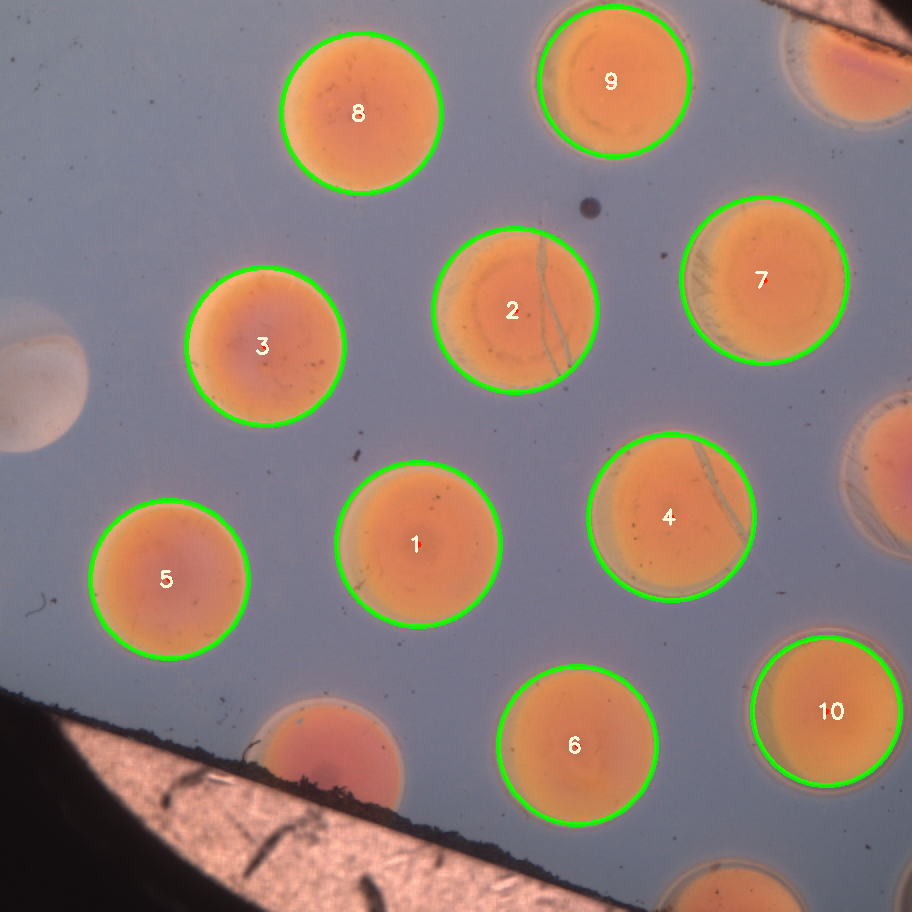

In [5]:

file_name = "navcam"
phenom.Activate()
phenom.MoveToNavCam()
acqCamParams = ppi.CamParams()
acqCamParams.size = ppi.Size(912, 912)
acqCamParams.nFrames = 16
hfw = phenom.GetHFW()
phenom.SetHFW(10e-3)
hfw = phenom.GetHFW()
print(f"HFW: {hfw*1e3:.2f} mm")


HFW_value = 10e-3  # 10 mm
move_to_x = 0e-3
move_to_y = 0e-3

phenom.SetHFW(HFW_value)
phenom.MoveTo(move_to_x, move_to_y, algorithm = ppi.NavigationAlgorithm.Raw)  
acqNavCam = phenom.NavCamAcquireImage(acqCamParams)
acqNavCam.metadata.displayWidth = 0.5
acqNavCam.metadata.dataBarLabel = "Label"
acqNavCamDatabar = ppi.AddDatabar(acqNavCam)
navcam_path = str(project_path / f"{file_name}.tiff")
navcam_databar_path = str(project_path / f"{file_name}_databar.tiff")


# 2. Save with ppi
ppi.Save(acqNavCam, navcam_path)
ppi.Save(acqNavCamDatabar, navcam_databar_path)


hfw = phenom.GetHFW()
#hfw = HFW_value

annotated, mask, circles, metadata_path = segment_circles(
    image_path       = navcam_path,
    d_min_mm         = 1.6,
    d_max_mm         = 1.9,
    hfw_metres       = hfw,
    stage_x_m        = move_to_x,
    stage_y_m        = move_to_y,
    hough_param2     = 45,
    output_dir       = project_path,
    min_circularity  = 0.95,
    edge_margin_frac = 0.8,
    random_seed      = 42
)


display(Image.fromarray(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)))

In [6]:

with open(metadata_path) as f:
    metadata = json.load(f)

phenom.MoveToSem()
phenom.SetSemHighTension(-10000)

time.sleep(5)

phenom.SetSemSpotSize(3.3)

SEM_HFWS = [30e-6]
sem_output = project_path/"sem_images"
sem_output.mkdir(parents=True, exist_ok=True)
results = []
SETTLE_TIME = 5


Circle 2/10  →  (0.000652, 0.001614) m
   Position error: (2.00, 1.50) µm
   Edge point (angle=0.0°): (0.001559, 0.001614) m
   Autofocus at edge...
   Auto brightness/contrast at edge...
   Autofocus done — WD: 5.617 mm

   Returning to centre...

   ── Location: centre  (0.000652, 0.001614) m ──

   ── HFW 30 µm ──────────────────────


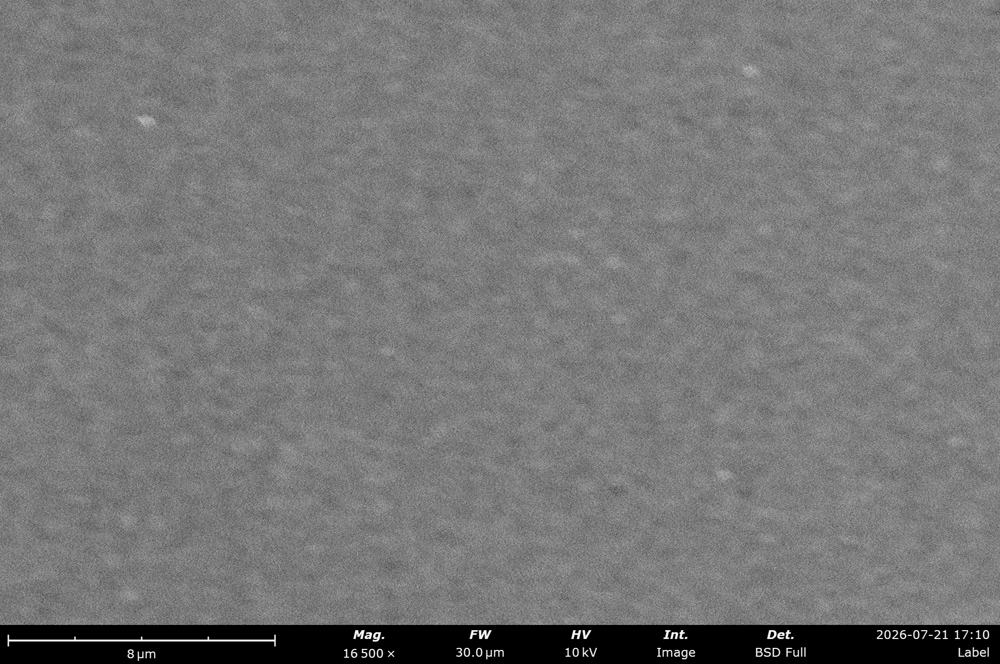

      Saved: circle_02_hfw_30.0um.tiff
      Saved: circle_02_hfw_30.0um_databar.tiff

   ── Location: ring_1_a0deg  (0.001196, 0.001614) m ──

   ── HFW 30 µm ──────────────────────


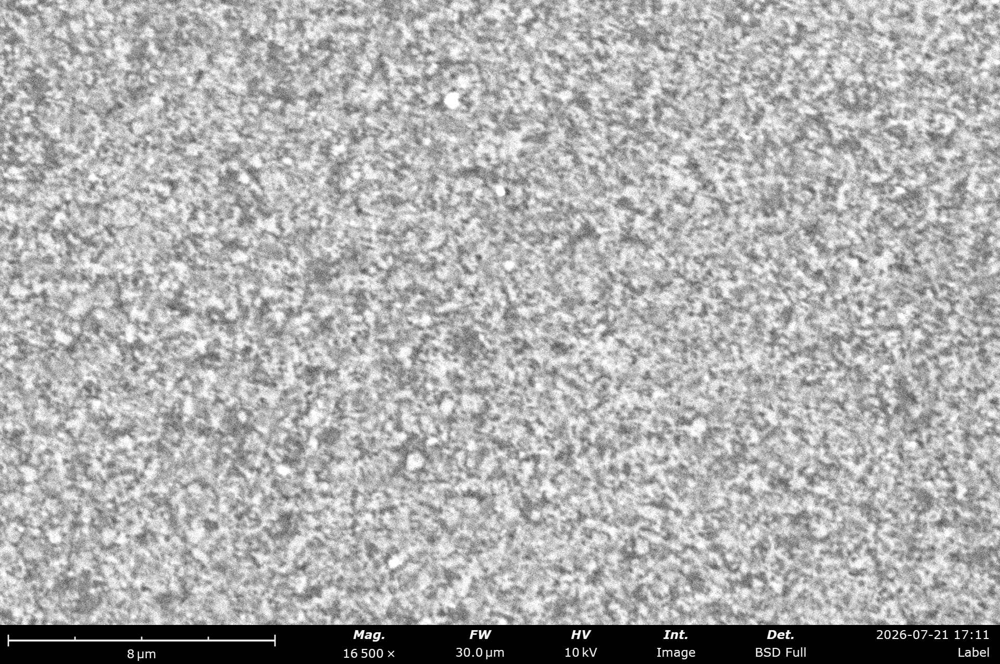

      Saved: circle_02_hfw_30.0um.tiff
      Saved: circle_02_hfw_30.0um_databar.tiff

   ── Location: ring_2_a72deg  (0.000820, 0.002131) m ──

   ── HFW 30 µm ──────────────────────


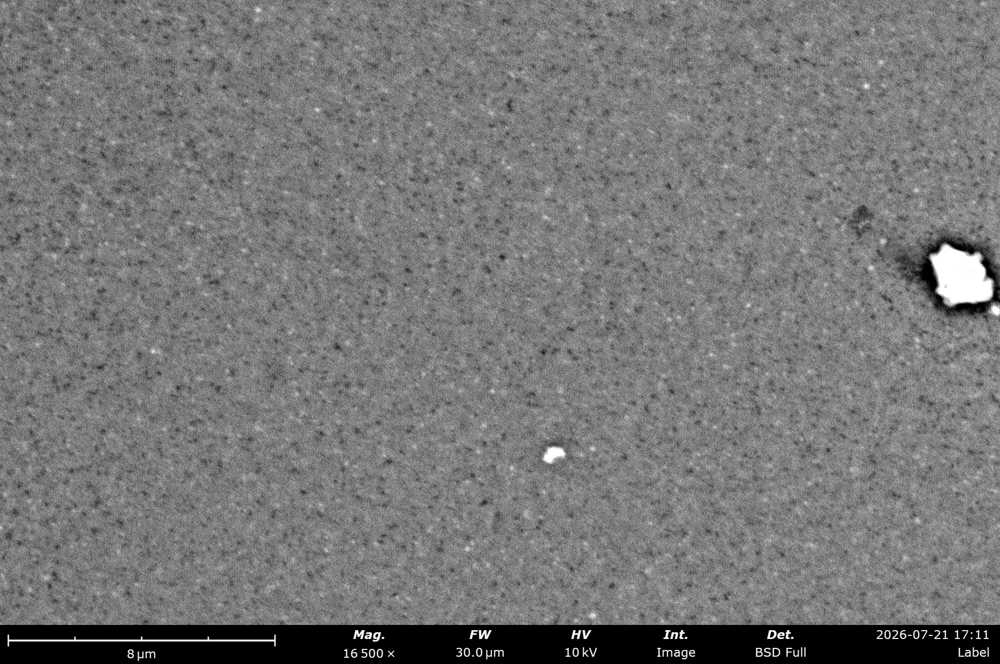

      Saved: circle_02_hfw_30.0um.tiff
      Saved: circle_02_hfw_30.0um_databar.tiff

   ── Location: ring_3_a144deg  (0.000212, 0.001934) m ──

   ── HFW 30 µm ──────────────────────


In [ ]:
def get_edge_positions(x_m, y_m, diameter_mm, n_points=4):
    """
    Return N positions evenly spaced around the circle edge in stage coordinates.
    Uses diameter_mm directly from circles_metadata.json
    """
    radius_m = (diameter_mm / 2) / 1000   # mm → m
    angles   = [i * (360 / n_points) for i in range(n_points)]
    
    positions = []
    for angle_deg in angles:
        angle_rad = math.radians(angle_deg)
        edge_x    = x_m + radius_m * math.cos(angle_rad)
        edge_y    = y_m + radius_m * math.sin(angle_rad)
        positions.append((edge_x, edge_y, angle_deg))

    return positions, radius_m


def get_inner_ring_points(x_m, y_m, diameter_mm, n_points=5, fraction_of_radius=0.75):

    radius_m = (diameter_mm / 1000) / 2
    angles = np.linspace(0, 2 * np.pi, n_points, endpoint=False)
    points = [
        (
            x_m + fraction_of_radius * radius_m * np.cos(theta),
            y_m + fraction_of_radius * radius_m * np.sin(theta),
            np.degrees(theta)
        )
        for theta in angles
    ]
    return points, radius_m

x_correction = 0.0
y_correction = 0.0
sem_metadata = []
trial_circle = [c for c in metadata["circles"] if c["id"] == 2]
for circle in trial_circle:
# for circle in metadata["circles"]:
    cid = circle["id"]
    x_m, y_m = circle["stage_centre_m"]
    diameter_mm  = circle["diameter_mm"]  
    print(f"\n{'='*55}")
    print(f"Circle {cid}/{len(metadata['circles'])}  →  ({x_m:.6f}, {y_m:.6f}) m")
    print(f"{'='*55}")

    # Overview HFW: just large enough to contain the full circle + margin
    

    try:
        phenom.MoveTo(x_m + x_correction, y_m + y_correction, algorithm = ppi.NavigationAlgorithm.BacklashOnly)
        time.sleep(SETTLE_TIME)
        stage_info = phenom.GetStageModeAndPosition()
        actual_x = stage_info.position.x
        actual_y = stage_info.position.y
        err_um = (abs(actual_x - x_m)*1e6, abs(actual_y - y_m)*1e6)
        print(f"   Position error: ({err_um[0]:.2f}, {err_um[1]:.2f}) µm")
        
        circle_dir = sem_output/f"circle_{cid:02d}"
        circle_dir.mkdir(parents=True, exist_ok=True)

        
        edge_positions, radius_m = get_edge_positions(
            x_m, y_m, diameter_mm, n_points=4
        )
        edge_x, edge_y, angle_deg = edge_positions[0]   # use first edge point
        print(f"   Edge point (angle={angle_deg}°): ({edge_x:.6f}, {edge_y:.6f}) m")

        # ── Move to edge for autofocus ────────────────────────────────────
        phenom.MoveTo(edge_x + x_correction, edge_y + y_correction, algorithm=ppi.NavigationAlgorithm.BacklashOnly)
        time.sleep(SETTLE_TIME)

        phenom.SetHFW(0.001) #HFW range max is 1.35 mm
        time.sleep(SETTLE_TIME)

        print("   Autofocus at edge...")
        phenom.SemAutoFocus(algorithm=ppi.AutoFocusAlgorithm.Auto)
        time.sleep(SETTLE_TIME)

        print("   Auto brightness/contrast at edge...")
        phenom.SemAutoContrastBrightness()
        time.sleep(SETTLE_TIME)

        base_wd = phenom.GetSemWD()
        print(f"   Autofocus done — WD: {base_wd*1000:.3f} mm")

        
        print(f"\n   Returning to centre...")
        phenom.MoveTo(x_m + x_correction, y_m + y_correction, algorithm=ppi.NavigationAlgorithm.BacklashOnly)
        time.sleep(SETTLE_TIME)


        inner_ring_points, radius_m = get_inner_ring_points(
            x_m, y_m, diameter_mm,
            n_points=5,
            fraction_of_radius=0.6
        )

        capture_locations = [("centre", x_m, y_m)] + [
            (f"ring_{i+1}_a{int(pt[2])}deg", pt[0], pt[1])
            for i, pt in enumerate(inner_ring_points)
        ]


        
        
        for loc_label, loc_x, loc_y in capture_locations:
            print(f"\n   ── Location: {loc_label}  ({loc_x:.6f}, {loc_y:.6f}) m ──")

            phenom.MoveTo(loc_x + x_correction, loc_y + y_correction, algorithm=ppi.NavigationAlgorithm.BacklashOnly)
            time.sleep(SETTLE_TIME)

            loc_dir = circle_dir / loc_label
            loc_dir.mkdir(parents=True, exist_ok=True)
       
            for hfw_val in SEM_HFWS:
                hfw_um = hfw_val * 1e6
                print(f"\n   ── HFW {hfw_val*1e6:.0f} µm ──────────────────────")

                # Set HFW
                phenom.SetHFW(hfw_val)
                time.sleep(SETTLE_TIME)

                phenom.SemAutoFocus(algorithm=ppi.AutoFocusAlgorithm.FineOnly)
                time.sleep(SETTLE_TIME)
                
                

                # Acquire SEM image

                acqScanParams = ppi.ScanParams()
                acqScanParams.size = ppi.Size(1920,1200)
                acqScanParams.detector = ppi.DetectorMode.All
                acqScanParams.nFrames = 16
                acqScanParams.hdr= False
                acqScanParams.scale = 1.0
                acq = phenom.SemAcquireImage(acqScanParams)
                acq.metadata.displayWidth = 0.5
                acq.metadata.dataBarLabel = "Label"
                acqWithDatabar = ppi.AddDatabar(acq)

                
                hfw_dir = loc_dir / f"hfw_{hfw_um}um"
                hfw_dir.mkdir(parents=True, exist_ok=True)

                raw_path      = hfw_dir / f"circle_{cid:02d}_hfw_{hfw_um}um.tiff"
                databar_path  = hfw_dir / f"circle_{cid:02d}_hfw_{hfw_um}um_databar.tiff"

                ppi.Save(acq,           str(raw_path))
                ppi.Save(acqWithDatabar, str(databar_path))

                #Display the acquired image with databar
                image = Image.open(databar_path)
                display(image)

                print(f"      Saved: {raw_path.name}")
                print(f"      Saved: {databar_path.name}")

                record = {
                    "circle_id" : cid,
                    "circle_diameter_mm": diameter_mm,
                    "circle_centre_x_m" : x_m,
                    "circle_centre_y_m" : y_m,
                    "location_label"    : loc_label,
                    "location_x_m"      : loc_x,
                    "location_y_m"      : loc_y,
                    "hfw_um"            : hfw_um,
                    "wd_mm"             : phenom.GetSemWD()*1000,
                    "brightness"        : phenom.GetSemBrightness(),
                    "contrast"          : phenom.GetSemContrast(),
                    "beam_energy"       : phenom.GetSemHighTension(),
                    "spot_size"         : phenom.GetSemSpotSize(),
                    "raw_path"          : str(raw_path),
                    "databar_path"      : str(databar_path)
                }
                sem_metadata.append(record)


    except Exception as e:
        print(f"   ERROR at circle {cid}: {e}")
        results.append({
            "circle_id" : cid,
            "stage_x_m" : x_m,
            "stage_y_m" : y_m,
            "status"    : "error",
            "error"     : str(e)
        })
        continue
        
sem_metadata_path = project_path / "sem_metadata.json"
with open(sem_metadata_path, "w") as f:
    json.dump(sem_metadata, f, indent=2)

print(f"\n{'='*55}")
print(f"SEM metadata saved → {sem_metadata_path}")
print(f"Total records         : {len(sem_metadata)}")
print(f"{'='*55}")


In [ ]:
unique_locations = {}
sem_metadata = json.load(open(sem_metadata_path))
for record in sem_metadata:
    key = (record["circle_id"], record["location_label"])
    if key not in unique_locations:
        unique_locations[key] = {
            "circle_id" : record["circle_id"],
            "location_label" : record["location_label"],
            "location_x_m" : record["location_x_m"],
            "location_y_m" : record["location_y_m"],
            "circle_dir": sem_output / f"circle_{record['circle_id']:02d}" / record["location_label"]
        }

print(f"Unique locations found: {len(unique_locations)}")

dpp = phenom.Spectrometer
dpp.ClearSpectrum()
settings = ppi.LoadEidSettings()
dpp.ApplySettings(settings.spot)
phenom.SetSemHighTension(-5000)
phenom.SetSemSpotSize(4.3)

  
for loc in unique_locations.values():
    circle_id = loc["circle_id"]
    label     = loc["location_label"]
    x_m       = loc["location_x_m"]
    y_m       = loc["location_y_m"]
    circle_dir = loc["circle_dir"]

    print(f"\nCircle {circle_id}, Location: {label}  ({x_m:.6f}, {y_m:.6f}) m")


    phenom.MoveTo(x_m + x_correction, y_m + y_correction, algorithm = ppi.NavigationAlgorithm.BacklashOnly)
    time.sleep(SETTLE_TIME)
    acqScanParams          = ppi.ScanParams()
    acqScanParams.size     = ppi.Size(1920, 1200)
    acqScanParams.detector = ppi.DetectorMode.All
    acqScanParams.nFrames  = 16
    acqScanParams.hdr      = False
    acqScanParams.center   = ppi.Position(x_m + x_correction , y_m + y_correction)   
    acqScanParams.scale    = 0.001                      # small scale = spot mode


    spot_mode = ppi.SemViewingMode(ppi.ScanMode.Spot, acqScanParams)
    phenom.SetSemViewingMode(spot_mode)

    dpp.ClearSpectrum()
    dpp.Start()
    time.sleep(SETTLE_TIME)
    dpp.Stop()

    raw_spectrum = dpp.GetSpectrum()
    beam_kv = abs(phenom.GetSemHighTension() / 1000)
    dict0 = {
        'offset' : raw_spectrum.offset,
        'scale'  : raw_spectrum.dispersion,
        'size'   : len(raw_spectrum.data),
        'units'  : 'eV'
    }
    s = hs.signals.Signal1D(np.array(raw_spectrum.data), axes=[dict0])
    s.set_signal_type("EDS_SEM")
    s.set_microscope_parameters(beam_energy=beam_kv)
    s.add_elements(['Cu', 'Si'])
    s.add_lines()
    identified_elements = s.metadata.Sample.elements
    print(f"Identified elements: {identified_elements}")
    msa_name =f"circle_{circle_id:02d}_{label}_{x_m:.6f}_{y_m:.6f}_3.msa"
    msa_path =f"{circle_dir}/{msa_name}"
    s.save(str(msa_path), encoding='utf8')
    print(f"Saved EDS: {msa_path}")


    energy_eV = s.axes_manager[0].axis  # Energy axis in eV
    spectrum = s.data   
    
    s.plot(True)
    # Add vertical lines at every 100 eV
    
    plt.axvline(930, color='gray', linestyle='--', linewidth=0.5, alpha=0.5)

    
    plt.show()

   



# ── Reset to imaging mode ─────────────────────────────────────────────────────
phenom.SetSemHighTension(-10000)
phenom.SetSemSpotSize(3.3)

imaging_params          = ppi.ScanParams()
imaging_params.size     = ppi.Size(1920, 1200)
imaging_params.detector = ppi.DetectorMode.All
imaging_params.nFrames  = 16
imaging_params.hdr      = False
imaging_params.center   = ppi.Position(-0.000354, 0.000807)
imaging_params.scale    = 1.0

imaging_mode = ppi.SemViewingMode(ppi.ScanMode.Imaging, imaging_params)
phenom.SetSemViewingMode(imaging_mode)
print("Reset to imaging mode")
